In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
%matplotlib inline

## EDA and Data Prep

In [81]:
xls = pd.ExcelFile('Final Data.xlsx')
df_cs = pd.read_excel(xls, 'CS')
df_ts = pd.read_excel(xls, 'TS')
df_fs = pd.read_excel(xls, 'FS')

In [82]:
print(df_cs.columns)
print(df_ts.columns)
print(df_fs.columns)

Index(['Ref.', 'S no', 'Cement', 'Fly ash C', 'Sand Zone 2', 'Sand Zone 3',
       'Sand Zone 4', 'Limestone', 'Blast Furnace Slag', 'Silica fume',
       'water/binder', 'Superplasticizer', 'Fiber Length(mm)',
       'Fiber Volume (%)', 'Fibre Elasticity (Mpa)', 'Fibre Diameter (µm)',
       'Aspect ratio ', 'Fiber Density (Kg/m3)', 'Compressive Strength (Mpa)'],
      dtype='object')
Index(['Ref.', 'S no', 'Cement', 'Fly ash C', 'Sand Zone 2', 'Sand Zone 3',
       'Sand Zone 4', 'Limestone', 'Blast Furnace Slag', 'Silica fume',
       'water/binder', 'Superplasticizer', 'Fiber Length(mm)',
       'Fiber Volume (%)', 'Fibre Elasticity (Mpa)', 'Fibre Diameter (µm)',
       'Aspect ratio ', 'Fiber Density (Kg/m3)',
       'Tensile Strain Capacity (%)'],
      dtype='object')
Index(['Ref.', 'S no', 'Cement', 'Fly ash C', 'Sand Zone 2', 'Sand Zone 3',
       'Sand Zone 4', 'Limestone', 'Blast Furnace Slag', 'Silica fume',
       'water/binder', 'Superplasticizer', 'Fiber Length(mm)',
   

In [83]:
df_cs.isnull().sum()

Ref.                          144
S no                            0
Cement                          1
Fly ash C                       1
Sand Zone 2                     0
Sand Zone 3                     0
Sand Zone 4                     1
Limestone                       1
Blast Furnace Slag              1
Silica fume                     1
water/binder                    1
Superplasticizer                1
Fiber Length(mm)                1
Fiber Volume (%)                1
Fibre Elasticity (Mpa)          1
Fibre Diameter (µm)             1
Aspect ratio                  421
Fiber Density (Kg/m3)           1
Compressive Strength (Mpa)      1
dtype: int64

In [84]:
df_cs = df_cs.drop(['S no', 'Ref.', 'Aspect ratio '], axis=1)
df_cs[['Superplasticizer']] = df_cs[['Superplasticizer']].fillna(df_cs['Superplasticizer'].mean())
df_cs = df_cs.dropna()
df_cs.isnull().sum()

Cement                        0
Fly ash C                     0
Sand Zone 2                   0
Sand Zone 3                   0
Sand Zone 4                   0
Limestone                     0
Blast Furnace Slag            0
Silica fume                   0
water/binder                  0
Superplasticizer              0
Fiber Length(mm)              0
Fiber Volume (%)              0
Fibre Elasticity (Mpa)        0
Fibre Diameter (µm)           0
Fiber Density (Kg/m3)         0
Compressive Strength (Mpa)    0
dtype: int64

In [85]:
print(len(df_cs))

420


In [86]:
df_ts.isnull().sum()

Ref.                           130
S no                             0
Cement                           1
Fly ash C                        1
Sand Zone 2                      0
Sand Zone 3                      0
Sand Zone 4                      5
Limestone                        1
Blast Furnace Slag               1
Silica fume                      1
water/binder                     1
Superplasticizer                 1
Fiber Length(mm)                 1
Fiber Volume (%)                 1
Fibre Elasticity (Mpa)           1
Fibre Diameter (µm)              1
Aspect ratio                   255
Fiber Density (Kg/m3)            1
Tensile Strain Capacity (%)      1
dtype: int64

In [87]:
df_ts = df_ts.drop(['S no', 'Ref.', 'Aspect ratio '], axis=1)
df_ts[['Sand Zone 4']] = df_ts[['Sand Zone 4']].fillna(df_ts['Sand Zone 4'].mean())
df_ts = df_ts.dropna()
df_ts.isnull().sum()

Cement                         0
Fly ash C                      0
Sand Zone 2                    0
Sand Zone 3                    0
Sand Zone 4                    0
Limestone                      0
Blast Furnace Slag             0
Silica fume                    0
water/binder                   0
Superplasticizer               0
Fiber Length(mm)               0
Fiber Volume (%)               0
Fibre Elasticity (Mpa)         0
Fibre Diameter (µm)            0
Fiber Density (Kg/m3)          0
Tensile Strain Capacity (%)    0
dtype: int64

In [88]:
len(df_ts)

254

In [89]:
df_fs.isnull().sum()

Ref.                       126
S no                         0
Cement                       0
Fly ash C                    0
Sand Zone 2                  0
Sand Zone 3                  0
Sand Zone 4                  0
Limestone                    0
Blast Furnace Slag           0
Silica fume                  0
water/binder                 0
Superplasticizer             0
Fiber Length(mm)             0
Fiber Volume (%)             0
Fibre Elasticity (Mpa)       0
Fibre Diameter (µm)          0
Aspect ratio               147
Fiber Density (Kg/m3)        0
Flexural Strength (Mpa)      0
dtype: int64

In [90]:
df_fs = df_fs.drop(['Ref.', 'S no', 'Aspect ratio '], axis=1)

In [91]:
len(df_fs)

147

In [92]:
print(df_cs.nunique(), df_ts.nunique(), df_fs.nunique())

Cement                         15
Fly ash C                      69
Sand Zone 2                     1
Sand Zone 3                     1
Sand Zone 4                    95
Limestone                       7
Blast Furnace Slag              4
Silica fume                     6
water/binder                   66
Superplasticizer               96
Fiber Length(mm)                7
Fiber Volume (%)               49
Fibre Elasticity (Mpa)         12
Fibre Diameter (µm)            11
Fiber Density (Kg/m3)           8
Compressive Strength (Mpa)    191
dtype: int64 Cement                          14
Fly ash C                       50
Sand Zone 2                      1
Sand Zone 3                      1
Sand Zone 4                     73
Limestone                        8
Blast Furnace Slag               6
Silica fume                      6
water/binder                    65
Superplasticizer                80
Fiber Length(mm)                 6
Fiber Volume (%)                38
Fibre Elasticity (Mpa) 

In [93]:
cs_y = df_cs['Compressive Strength (Mpa)']
ts_y = df_ts['Tensile Strain Capacity (%)']
fs_y = df_fs['Flexural Strength (Mpa)']
cs_x, ts_x, fs_x = df_cs.drop(['Compressive Strength (Mpa)'], axis=1), df_ts.drop(['Tensile Strain Capacity (%)'], axis=1), df_fs.drop(['Flexural Strength (Mpa)'], axis=1)

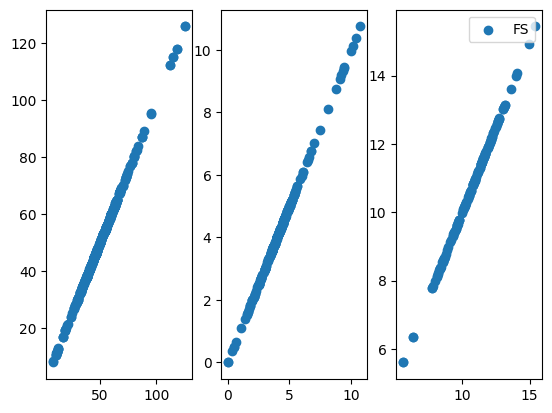

In [94]:
figure, ax = plt.subplots(1,3)
ax[0].scatter(cs_y, cs_y, label='CS')
ax[1].scatter(ts_y, ts_y, label='TS')
ax[2].scatter(fs_y, fs_y, label='FS')
plt.legend()

<Axes: >

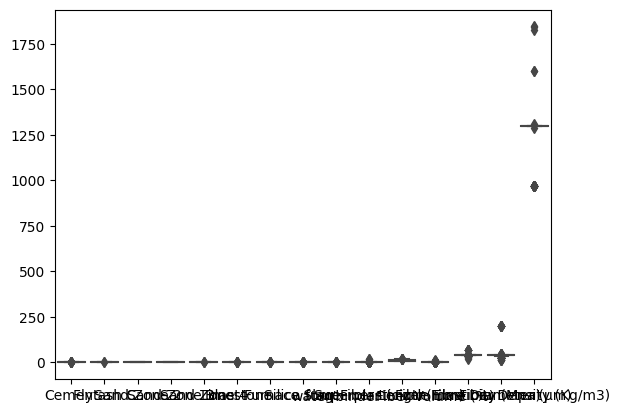

In [95]:
sns.boxplot(data=cs_x)

<Axes: >

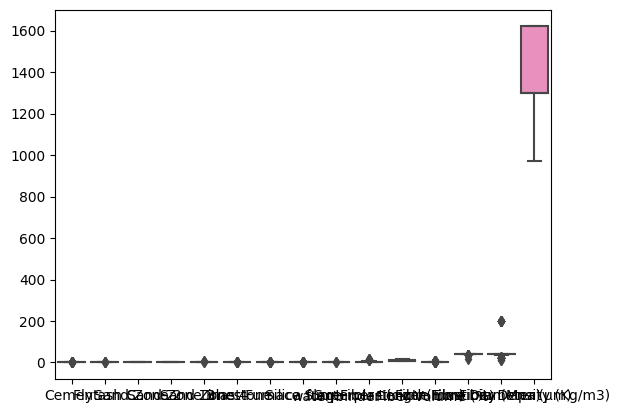

In [96]:
sns.boxplot(data=ts_x)

<Axes: >

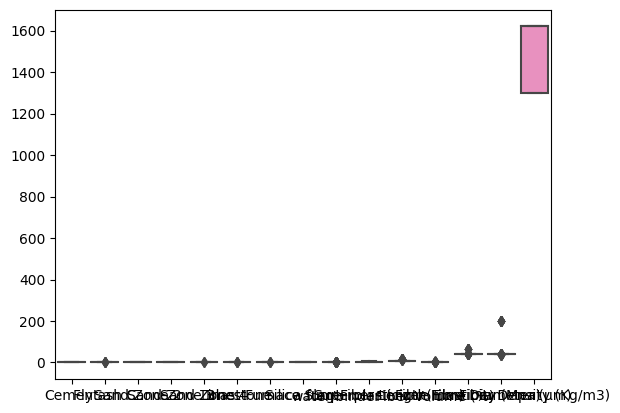

In [97]:
sns.boxplot(data=fs_x)

In [20]:
# bestfeatures = SelectKBest(score_func=f_regression, k=8)
# fit = bestfeatures.fit(cs_x,cs_y)
# dfscores = pd.DataFrame(fit.scores_)
# dfcolumns = pd.DataFrame(cs_x.columns)
# #concat two dataframes for better visualization 
# featureScores = pd.concat([dfcolumns,dfscores],axis=1)
# featureScores.columns = ['Specs','Score']  #naming the dataframe columns
# cols = featureScores.nlargest(8,'Score')['Specs'] #print 5 best features
# cs_x = cs_x[cols]

In [21]:
# bestfeatures = SelectKBest(score_func=f_regression, k=10)
# fit = bestfeatures.fit(ts_x,ts_y)
# dfscores = pd.DataFrame(fit.scores_)
# dfcolumns = pd.DataFrame(ts_x.columns)
# # concat two dataframes for better visualization 
# featureScores = pd.concat([dfcolumns,dfscores],axis=1)
# featureScores.columns = ['Specs','Score']  #naming the dataframe columns
# cols = featureScores.nlargest(8,'Score')['Specs'] #print 5 best features
# ts_x = ts_x[cols]

In [22]:
# bestfeatures = SelectKBest(score_func=f_regression, k=10)
# fit = bestfeatures.fit(fs_x,fs_y)
# dfscores = pd.DataFrame(fit.scores_)
# dfcolumns = pd.DataFrame(fs_x.columns)
# #concat two dataframes for better visualization 
# featureScores = pd.concat([dfcolumns,dfscores],axis=1)
# featureScores.columns = ['Specs','Score']  #naming the dataframe columns
# cols = featureScores.nlargest(8,'Score')['Specs'] #print 5 best features
# fs_x = fs_x[cols]

In [98]:
print(cs_x.shape, ts_x.shape, fs_x.shape)

(420, 15) (254, 15) (147, 15)


In [99]:
print(cs_y.shape, ts_y.shape, fs_y.shape)

(420,) (254,) (147,)


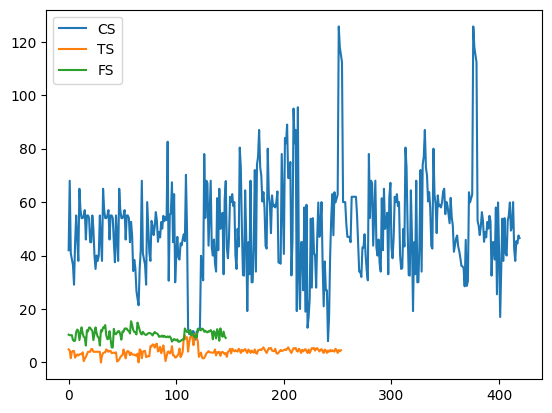

In [100]:
plt.plot(range(len(cs_y)), cs_y, label='CS')
plt.plot(range(len(ts_y)), ts_y, label='TS')
plt.plot(range(len(fs_y)), fs_y, label='FS')
plt.legend()

In [101]:
total_x = pd.concat([cs_x, ts_x, fs_x], axis=0)
total_x.shape

(821, 15)

<Axes: >

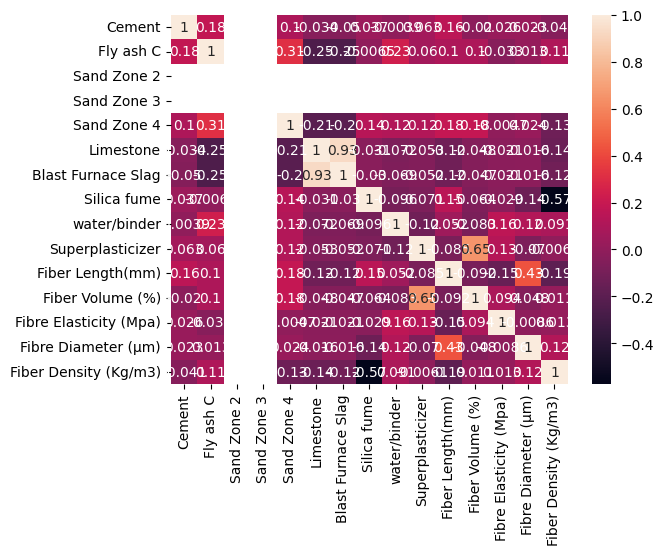

In [102]:
cs_corr = cs_x.corr()
sns.heatmap(cs_corr, annot=True)

<Axes: >

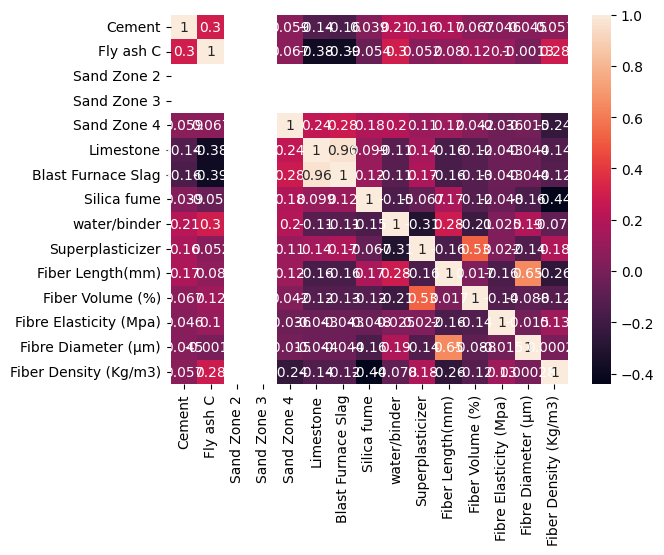

In [103]:
ts_corr = ts_x.corr()
sns.heatmap(ts_corr, annot=True)

<Axes: >

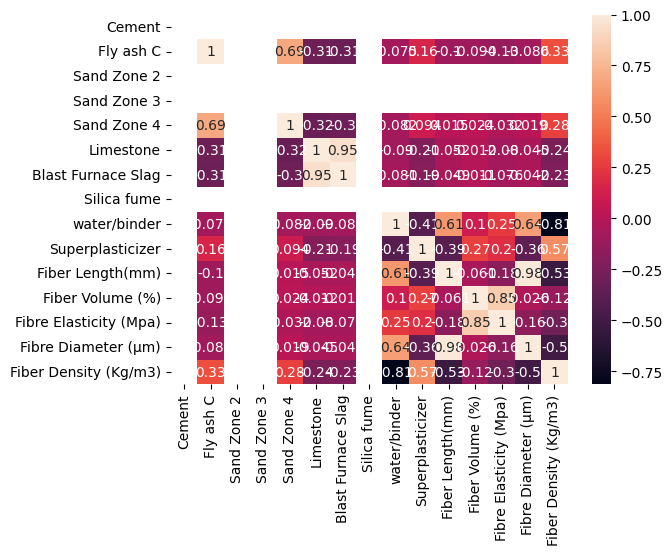

In [104]:
fs_corr = fs_x.corr()
sns.heatmap(fs_corr, annot=True)
# nan because values are constant

In [105]:
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()
cs_x, ts_x, fs_x = min_max_scaler.fit_transform(cs_x), min_max_scaler.fit_transform(ts_x), min_max_scaler.fit_transform(fs_x)

In [106]:
cs_x_train, cs_x_test, cs_y_train, cs_y_test = train_test_split(cs_x, cs_y, random_state=42, test_size=0.2, shuffle=True)
print(cs_x_train.shape, cs_y_train.shape, cs_x_test.shape)

(336, 15) (336,) (84, 15)


In [107]:
ts_x_train, ts_x_test, ts_y_train, ts_y_test = train_test_split(ts_x, ts_y, random_state=42, test_size=0.2, shuffle=True)
print(ts_x_train.shape, ts_y_train.shape, ts_x_test.shape)

(203, 15) (203,) (51, 15)


In [108]:
fs_x_train, fs_x_test, fs_y_train, fs_y_test = train_test_split(fs_x, fs_y, random_state=42, test_size=0.2, shuffle=True)
print(fs_x_train.shape, fs_y_train.shape, fs_x_test.shape)

(117, 15) (117,) (30, 15)


## Models

In [109]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn.model_selection import KFold, cross_val_score

final_preds = {'CS': [], 'TS': [], 'FS': []}

def pipeline(model, train_x, train_y, test_x, test_y, sheet_name):
    model.fit(train_x, train_y)
    pred_train = model.predict(train_x)
    pred_df = pd.DataFrame(pred_train, columns=[str(model)])
    pred_test = model.predict(test_x)
    plt.plot(train_y.values, train_y.values)
    plt.plot(1.2*train_y.values, train_y.values, '-')
    plt.plot(0.8*train_y.values, train_y.values, '-')
    plt.scatter(train_y.values, pred_train)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    print('Train r2: ', r2_score(train_y, pred_train))
    print('Train MAE: ', mean_absolute_error(train_y, pred_train))
    print('Train RMSE: ', np.sqrt(mean_squared_error(train_y, pred_train)))
    print('Test r2: ', r2_score(test_y, pred_test))
    print('Test MAE: ', mean_absolute_error(test_y, pred_test))
    print('Test RMSE: ', np.sqrt(mean_squared_error(test_y, pred_test)))
    print('Scatter Index:', np.sqrt(mean_squared_error(train_y, pred_train))/np.mean(pred_train)*100)

    cv = KFold(n_splits=5)
    scores = cross_val_score(model, train_x, train_y, scoring='neg_mean_absolute_error', cv=cv)
    print('K Fold MAE:', -np.mean(scores))

    figure, axis = plt.subplots(2, 1)
    figure.set_figheight(15)
    figure.set_figwidth(30)
    final_preds[sheet_name].append({str(model): pred_train})
    axis[0].plot(range(len(test_x)), pred_test, label='Pred')
    axis[0].plot(range(len(test_x)), test_y, label='Orig')

    axis[1].plot(range(len(train_x)), pred_train, label='Pred')
    axis[1].plot(range(len(train_x)), train_y, label='Orig')
    plt.legend()
    plt.title(str(model))


### Linear Regression

Train r2:  0.255101469599069
Train MAE:  11.74363954509184
Train RMSE:  16.212629865008562
Test r2:  0.1617073135793553
Test MAE:  10.017482487970014
Test RMSE:  13.251905061898688
Scatter Index: 31.70751852642103
K Fold MAE: 12.132652554574936


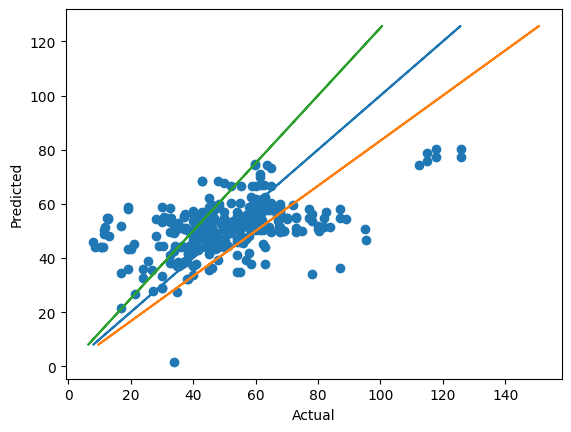

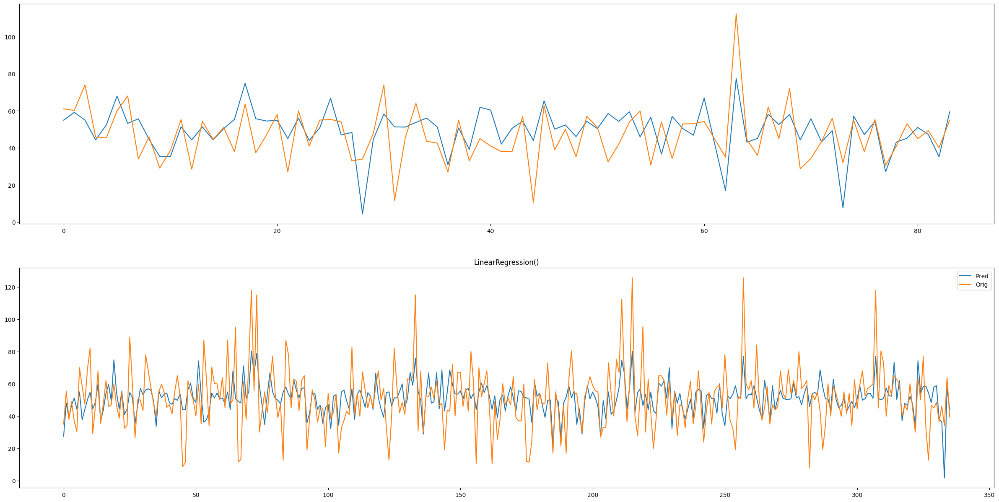

In [110]:
from sklearn.linear_model import LinearRegression
train_cs = pd.DataFrame(cs_y_train.values, columns=['Actual'])
model = LinearRegression()
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Train r2:  0.6886179826756976
Train MAE:  0.6851781599424692
Train RMSE:  0.9195930484918627
Test r2:  0.5282943805000869
Test MAE:  0.9030921932193386
Test RMSE:  1.1614258753994477
Scatter Index: 21.922585093167378
K Fold MAE: 0.7428078914008778


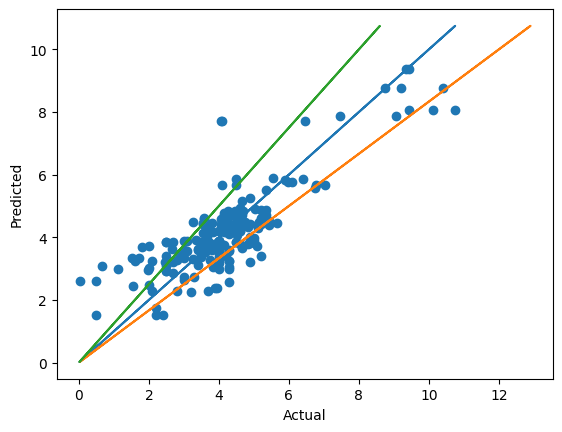

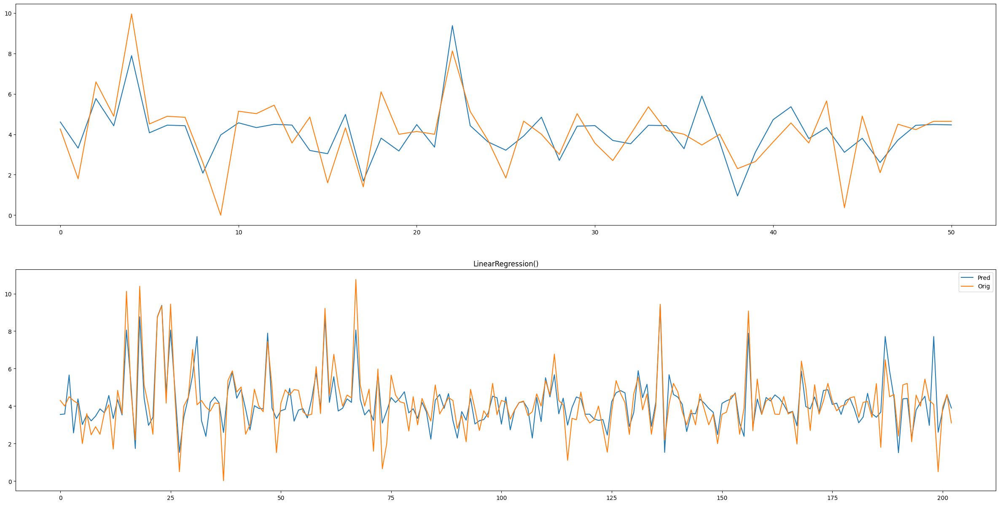

In [111]:
train_ts = pd.DataFrame(ts_y_train.values, columns=['Actual'])
model = LinearRegression()
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Train r2:  0.4270866168530182
Train MAE:  0.9838912666415167
Train RMSE:  1.2938126945810668
Test r2:  0.37326431477180533
Test MAE:  1.2472344728172262
Test RMSE:  1.4356103912222267
Scatter Index: 12.238146789281839
K Fold MAE: 1.2052738957003026


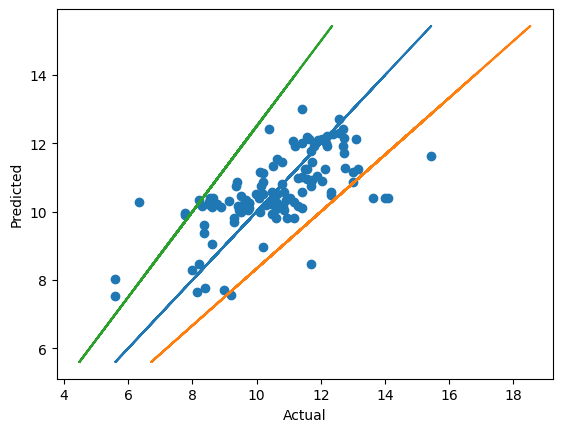

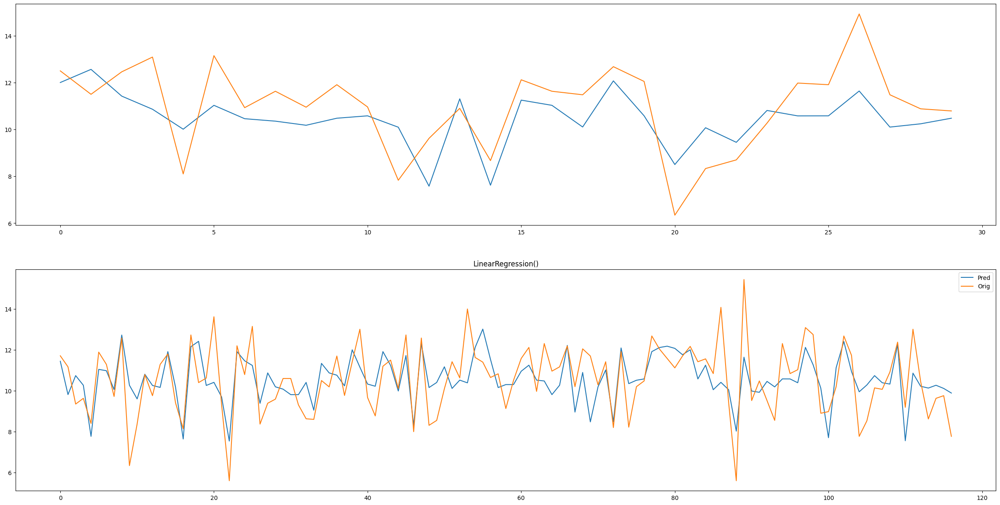

In [112]:
train_fs = pd.DataFrame(fs_y_train.values, columns=['Actual'])
model = LinearRegression()
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

### Ridge Regression

Train r2:  0.24890165229639716
Train MAE:  11.701401119100034
Train RMSE:  16.279959210370563
Test r2:  0.1900841835391519
Test MAE:  9.747758299348664
Test RMSE:  13.025680379238384
Scatter Index: 31.839196513472682
K Fold MAE: 12.027005541787835


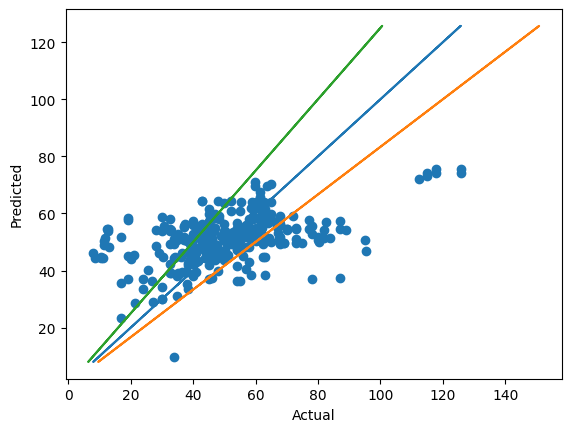

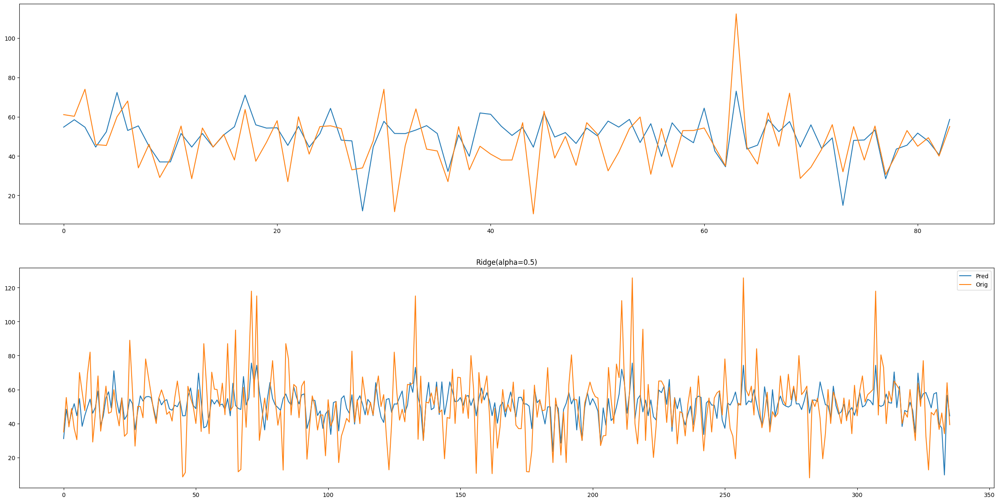

In [113]:
from sklearn.linear_model import Ridge

model = Ridge(alpha=0.5)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Train r2:  0.6817287003014058
Train MAE:  0.6921129599830051
Train RMSE:  0.9297103258253314
Test r2:  0.5351570027189887
Test MAE:  0.8823345452264446
Test RMSE:  1.1529464032496473
Scatter Index: 22.163775338806886
K Fold MAE: 0.7399266986207407


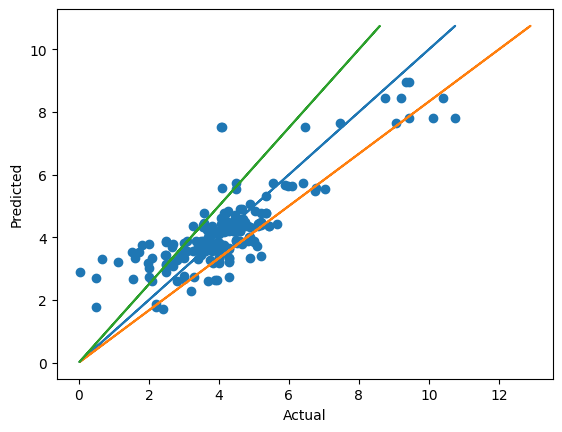

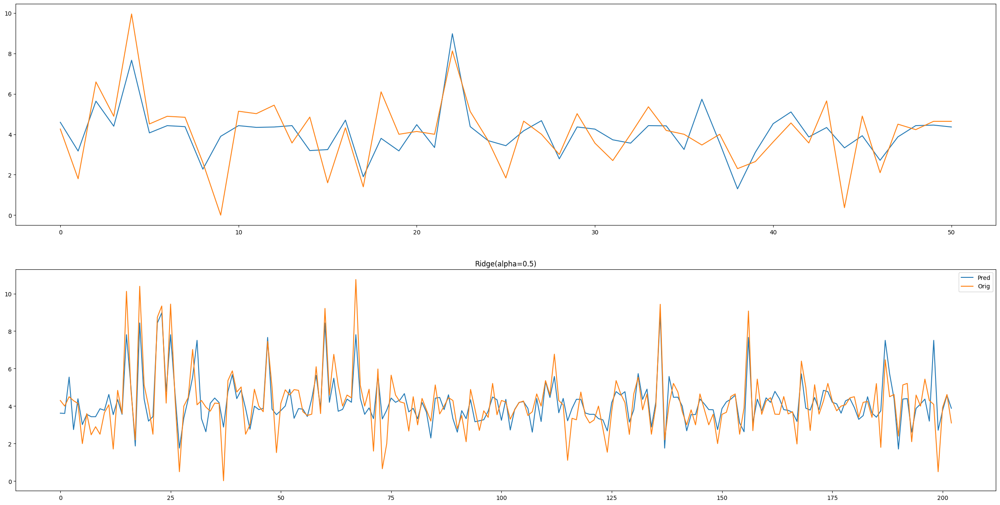

In [114]:
model = Ridge(alpha=0.5)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Train r2:  0.3523861312929588
Train MAE:  1.0215456943769383
Train RMSE:  1.375577281703334
Test r2:  0.26518953599692074
Test MAE:  1.3416782208878404
Test RMSE:  1.55446893576016
Scatter Index: 13.011556281674656
K Fold MAE: 1.1830744841543248


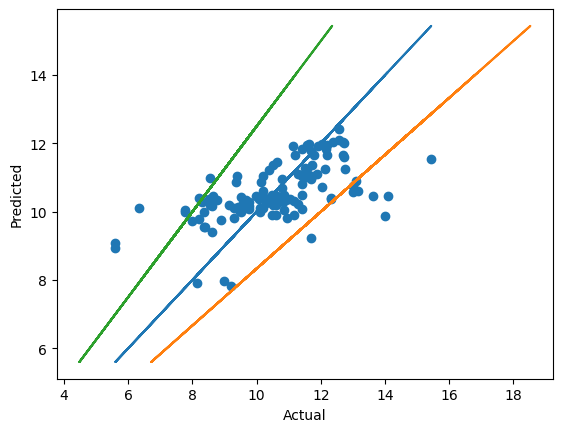

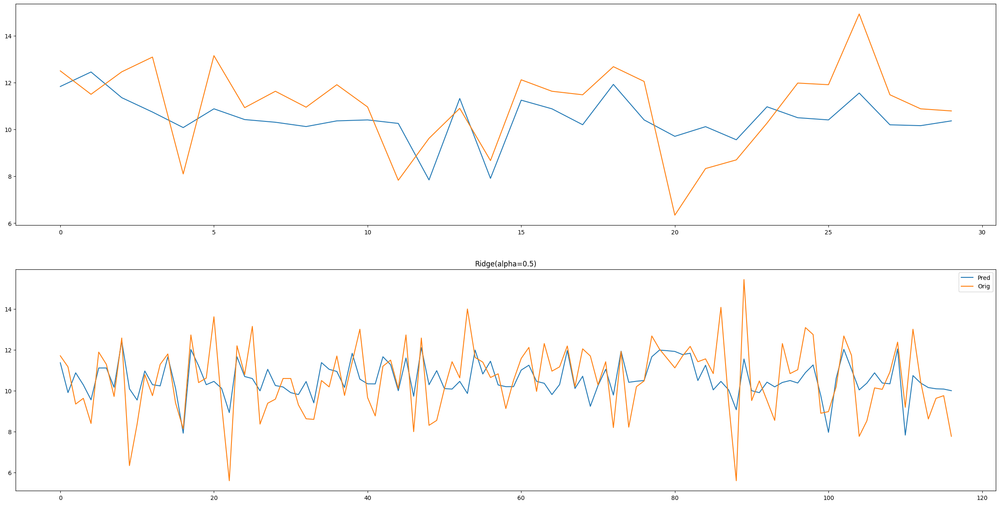

In [115]:
model = Ridge(alpha=0.5)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

### Lasso Regression

Train r2:  0.24657504807176056
Train MAE:  11.772994072467506
Train RMSE:  16.305154136802237
Test r2:  0.17121451041856295
Test MAE:  9.964968868005043
Test RMSE:  13.176544913027278
Scatter Index: 31.88847097438722
K Fold MAE: 12.10070461220622


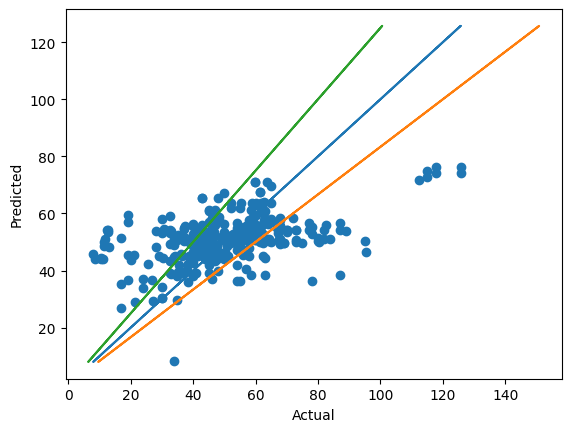

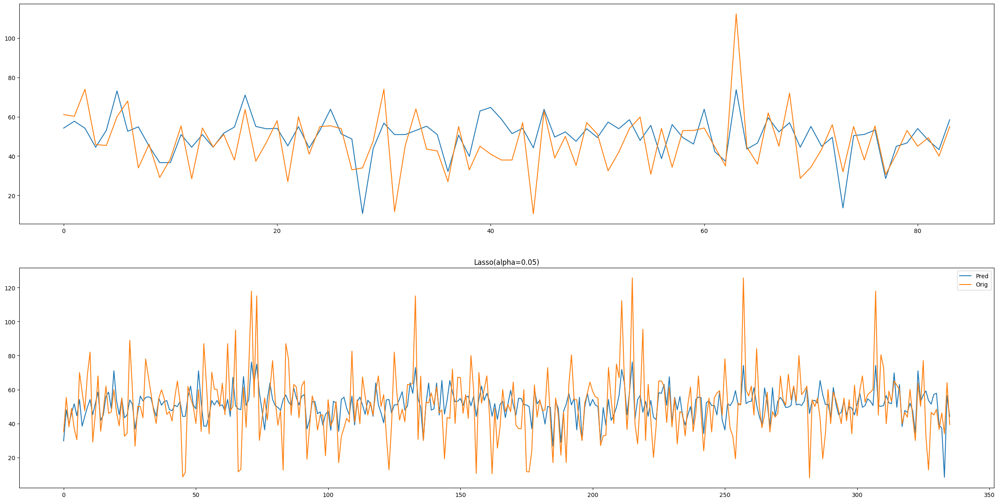

In [116]:
from sklearn.linear_model import Lasso

model = Lasso(alpha=0.05)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Train r2:  0.6718688467903229
Train MAE:  0.702903161132588
Train RMSE:  0.9440014210956839
Test r2:  0.5187442671645284
Test MAE:  0.9175836759107173
Test RMSE:  1.1731240287013496
Scatter Index: 22.504467074844552
K Fold MAE: 0.7534752689863726


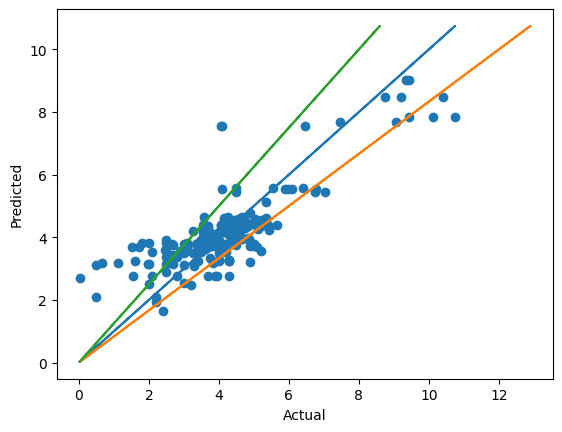

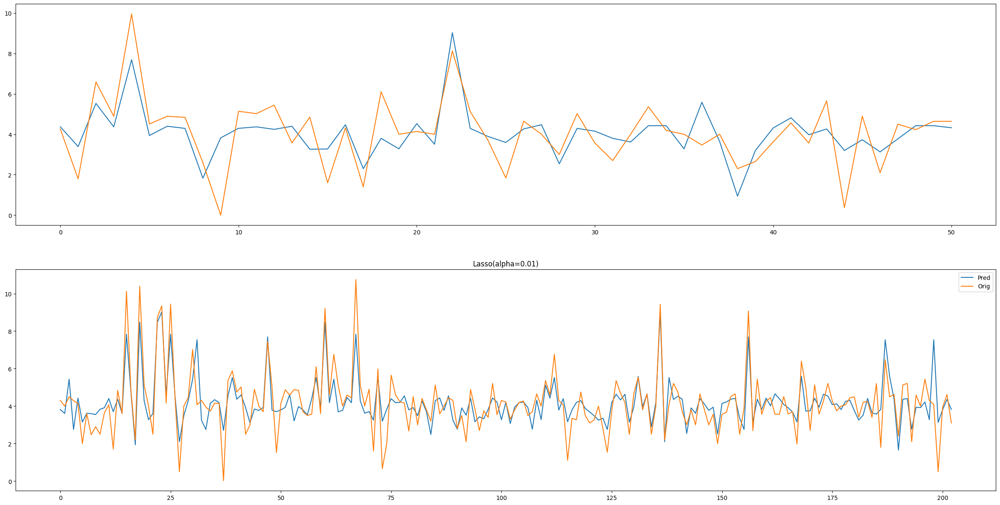

In [117]:
model = Lasso(alpha=0.01)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Train r2:  0.42525954137995947
Train MAE:  0.9862292185958503
Train RMSE:  1.2958740984854256
Test r2:  0.35569208649954887
Test MAE:  1.2650159939409322
Test RMSE:  1.4555968739591807
Scatter Index: 12.257645565015912
K Fold MAE: 1.1844288653465802


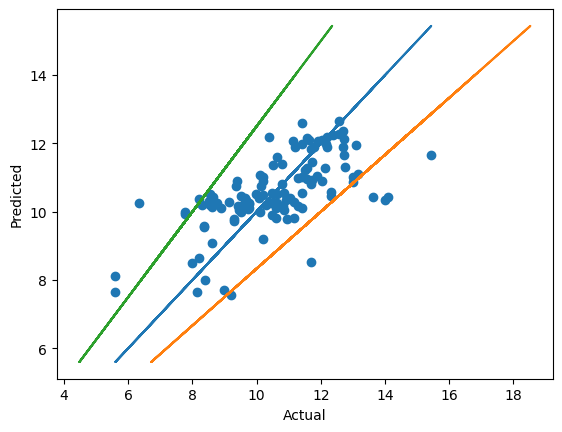

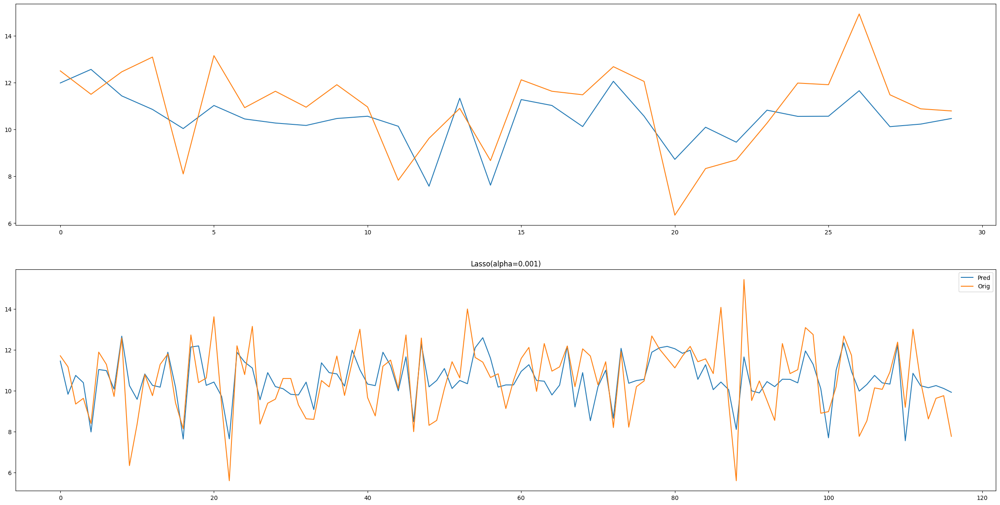

In [118]:
model = Lasso(alpha=0.001)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

### Symbolic Regression

In [119]:
# from gplearn.genetic import SymbolicRegressor

# function_set = ['add', 'sub', 'mul', 'div','cos','sin','neg','inv']
# est_gp = SymbolicRegressor(population_size=5000,function_set=function_set,
#                            generations=40, stopping_criteria=0.01,
#                            p_crossover=0.7, p_subtree_mutation=0.1,
#                            p_hoist_mutation=0.05, p_point_mutation=0.1,
#                            max_samples=0.9, verbose=1,
#                            parsimony_coefficient=0.01, random_state=0)
# converter = {
#     'sub': lambda x, y : x - y,
#     'div': lambda x, y : x/y,
#     'mul': lambda x, y : x*y,
#     'add': lambda x, y : x + y,
#     'neg': lambda x    : -x,
#     'pow': lambda x, y : x**y,
#     'sin': lambda x    : sin(x),
#     'cos': lambda x    : cos(x),
#     'inv': lambda x: 1/x,
#     'sqrt': lambda x: x**0.5,
#     'pow3': lambda x: x**3
# }

# est_gp.fit(cs_x_train, cs_y_train)
# print('R2:',est_gp.score(cs_x_test,cs_y_test))

In [120]:
# from sympy import *
# next_e = sympify((est_gp._program), locals=converter)
# next_e

In [121]:
# preds = est_gp.predict(cs_x_test)
# plt.plot(range(len(cs_x_test)), preds, label='Pred')
# plt.plot(range(len(cs_x_test)), cs_y_test, label='Orig')
# plt.legend()
# plt.title(str(model))

### Decision Tree Regressor

Train r2:  0.4393041076736238
Train MAE:  10.509536168711307
Train RMSE:  14.065934682110447
Test r2:  -0.062414269075067086
Test MAE:  11.084354727244923
Test RMSE:  14.91857784461333
Scatter Index: 27.509163426165173
K Fold MAE: 12.605629978438317


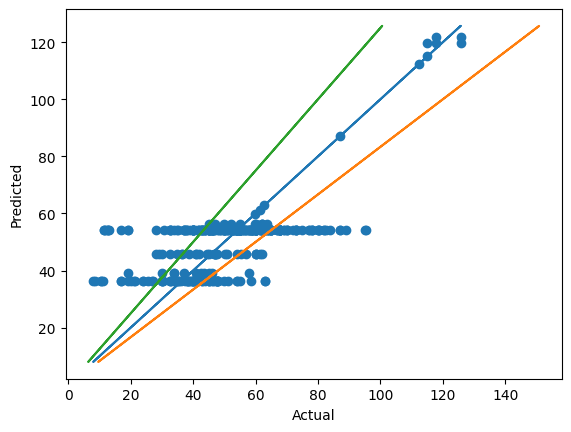

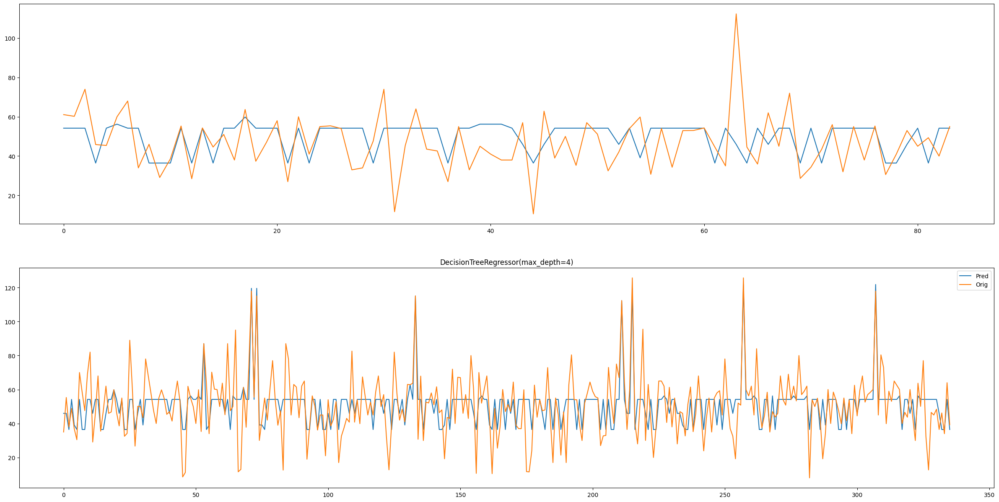

In [122]:
from sklearn.tree import DecisionTreeRegressor
model = DecisionTreeRegressor(max_depth = 4)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

In [123]:
from sklearn import tree
text_representation = tree.export_text(model)
print(text_representation)


|--- feature_4 <= 0.21
|   |--- feature_10 <= 0.96
|   |   |--- feature_14 <= 0.18
|   |   |   |--- feature_9 <= 0.14
|   |   |   |   |--- value: [56.23]
|   |   |   |--- feature_9 >  0.14
|   |   |   |   |--- value: [119.57]
|   |   |--- feature_14 >  0.18
|   |   |   |--- feature_12 <= 0.44
|   |   |   |   |--- value: [39.12]
|   |   |   |--- feature_12 >  0.44
|   |   |   |   |--- value: [54.20]
|   |--- feature_10 >  0.96
|   |   |--- feature_7 <= 0.11
|   |   |   |--- value: [59.88]
|   |   |--- feature_7 >  0.11
|   |   |   |--- feature_9 <= 0.00
|   |   |   |   |--- value: [121.81]
|   |   |   |--- feature_9 >  0.00
|   |   |   |   |--- value: [115.08]
|--- feature_4 >  0.21
|   |--- feature_10 <= 0.96
|   |   |--- feature_8 <= 0.71
|   |   |   |--- feature_1 <= 0.37
|   |   |   |   |--- value: [45.97]
|   |   |   |--- feature_1 >  0.37
|   |   |   |   |--- value: [36.46]
|   |   |--- feature_8 >  0.71
|   |   |   |--- value: [87.00]
|   |--- feature_10 >  0.96
|   |   |--- feat

Train r2:  0.7380067484465989
Train MAE:  0.6344783633961751
Train RMSE:  0.8435172494574781
Test r2:  0.4924048818170932
Test MAE:  0.8858004815961472
Test RMSE:  1.2047992560973544
Scatter Index: 20.108980498616376
K Fold MAE: 0.7477926939833377


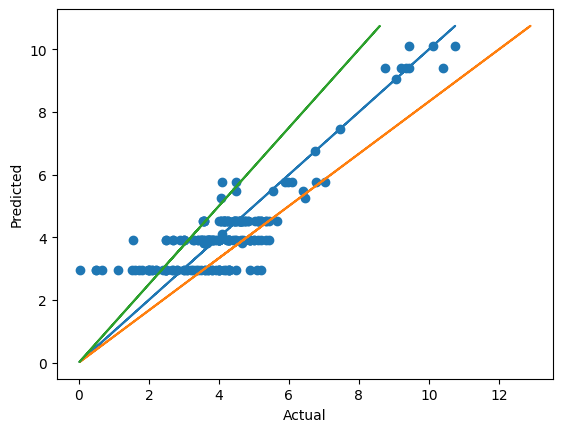

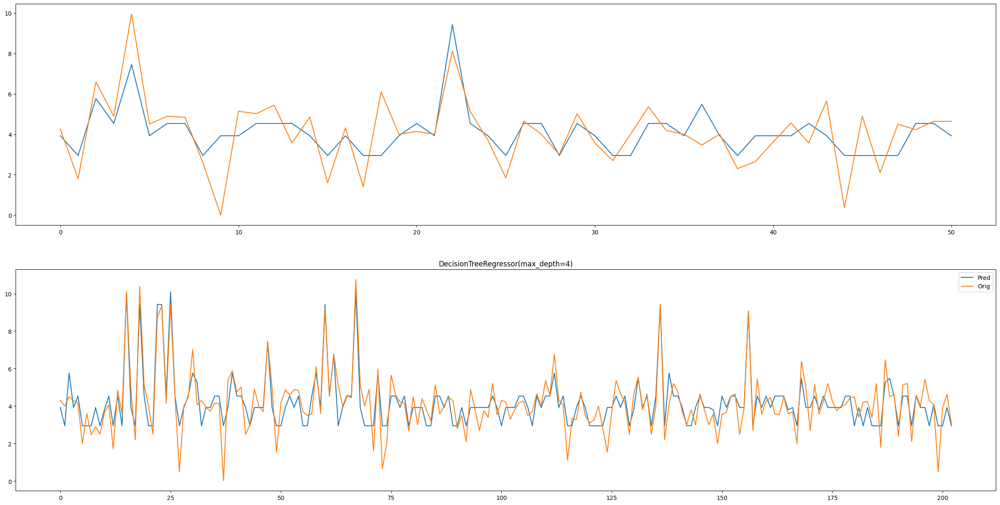

In [124]:
model = DecisionTreeRegressor(max_depth = 4)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

In [125]:
text_representation = tree.export_text(model)
print(text_representation)

|--- feature_7 <= 0.62
|   |--- feature_13 <= 0.57
|   |   |--- feature_14 <= 0.75
|   |   |   |--- feature_11 <= 0.15
|   |   |   |   |--- value: [2.95]
|   |   |   |--- feature_11 >  0.15
|   |   |   |   |--- value: [3.93]
|   |   |--- feature_14 >  0.75
|   |   |   |--- feature_1 <= 0.95
|   |   |   |   |--- value: [4.54]
|   |   |   |--- feature_1 >  0.95
|   |   |   |   |--- value: [3.80]
|   |--- feature_13 >  0.57
|   |   |--- feature_4 <= 0.15
|   |   |   |--- feature_4 <= 0.12
|   |   |   |   |--- value: [5.48]
|   |   |   |--- feature_4 >  0.12
|   |   |   |   |--- value: [5.77]
|   |   |--- feature_4 >  0.15
|   |   |   |--- feature_1 <= 0.43
|   |   |   |   |--- value: [5.76]
|   |   |   |--- feature_1 >  0.43
|   |   |   |   |--- value: [6.76]
|--- feature_7 >  0.62
|   |--- feature_9 <= 0.00
|   |   |--- feature_4 <= 0.16
|   |   |   |--- feature_9 <= 0.00
|   |   |   |   |--- value: [9.42]
|   |   |   |--- feature_9 >  0.00
|   |   |   |   |--- value: [10.10]
|   |   |--

Train r2:  0.6613871282821892
Train MAE:  0.7275742633434941
Train RMSE:  0.9946691670288699
Test r2:  0.5015730721373785
Test MAE:  0.9390215617715624
Test RMSE:  1.280251018972353
Scatter Index: 9.408554517865163
K Fold MAE: 1.2019434310726926


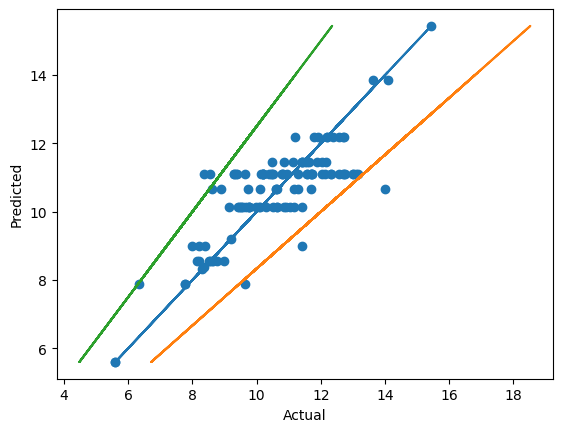

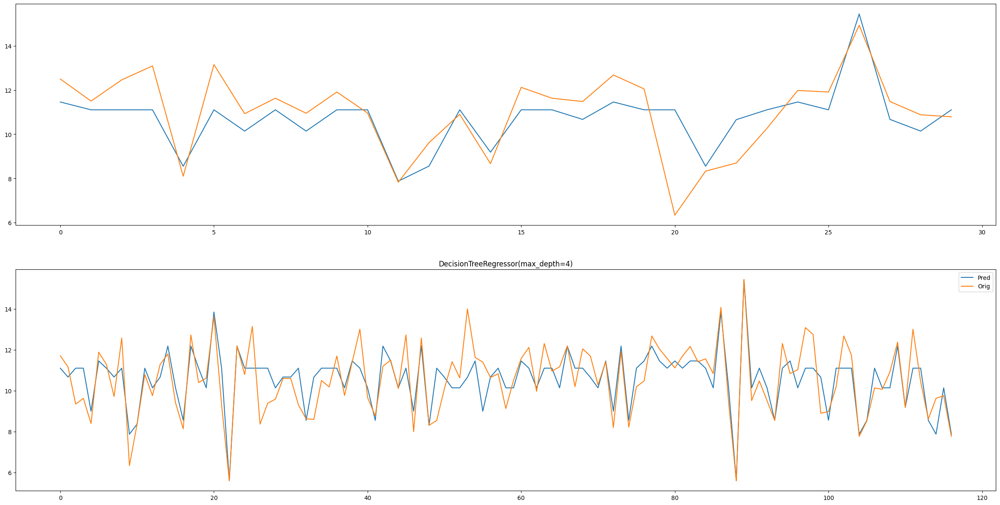

In [126]:
model = DecisionTreeRegressor(max_depth = 4)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

In [127]:
text_representation = tree.export_text(model)
print(text_representation)

|--- feature_4 <= 0.56
|   |--- feature_9 <= 0.62
|   |   |--- feature_12 <= 0.54
|   |   |   |--- feature_13 <= 0.00
|   |   |   |   |--- value: [9.00]
|   |   |   |--- feature_13 >  0.00
|   |   |   |   |--- value: [11.11]
|   |   |--- feature_12 >  0.54
|   |   |   |--- feature_11 <= 0.56
|   |   |   |   |--- value: [5.60]
|   |   |   |--- feature_11 >  0.56
|   |   |   |   |--- value: [10.66]
|   |--- feature_9 >  0.62
|   |   |--- feature_8 <= 0.23
|   |   |   |--- feature_9 <= 0.84
|   |   |   |   |--- value: [11.46]
|   |   |   |--- feature_9 >  0.84
|   |   |   |   |--- value: [12.19]
|   |   |--- feature_8 >  0.23
|   |   |   |--- feature_9 <= 0.69
|   |   |   |   |--- value: [13.85]
|   |   |   |--- feature_9 >  0.69
|   |   |   |   |--- value: [15.44]
|--- feature_4 >  0.56
|   |--- feature_8 <= 0.23
|   |   |--- feature_4 <= 0.83
|   |   |   |--- feature_9 <= 0.39
|   |   |   |   |--- value: [10.67]
|   |   |   |--- feature_9 >  0.39
|   |   |   |   |--- value: [10.14]
|   

### Random Forest

Train r2:  0.753278138209232
Train MAE:  6.740492511140655
Train RMSE:  9.330581827957113
Test r2:  0.33017746480154164
Test MAE:  8.782720011456874
Test RMSE:  11.845689770070129
Scatter Index: 18.160037925790228
K Fold MAE: 10.31650469116697


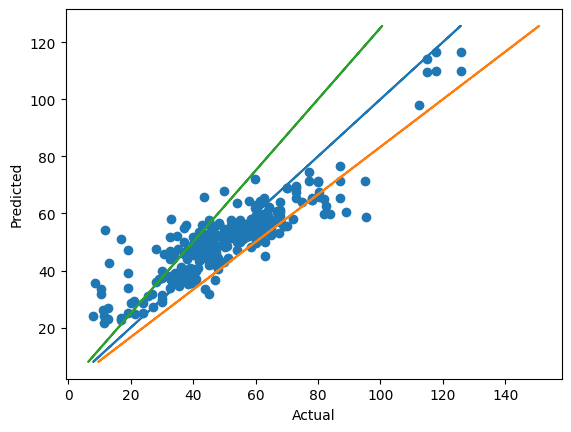

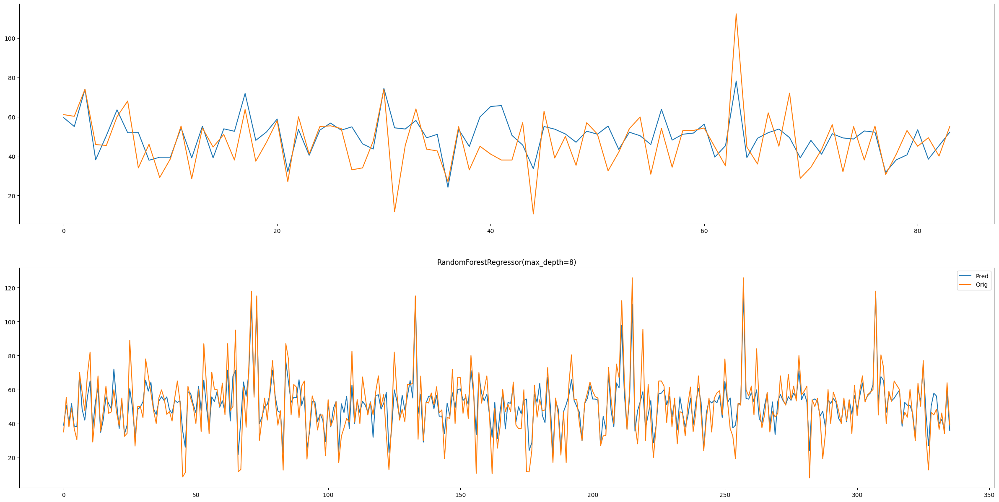

In [128]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(max_depth = 8)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

In [129]:
pickle.dump(model, open('cs.sav', 'wb'))

Train r2:  0.906745152118612
Train MAE:  0.372238562144344
Train RMSE:  0.503250974648378
Test r2:  0.5940845124878416
Test MAE:  0.7770662907410864
Test RMSE:  1.0773920916175288
Scatter Index: 11.980965977224354
K Fold MAE: 0.6271979679880157


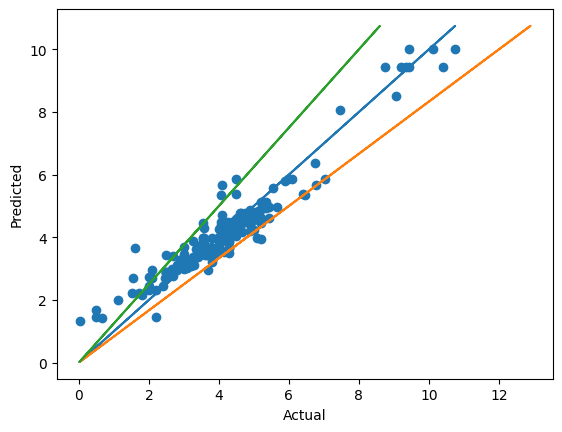

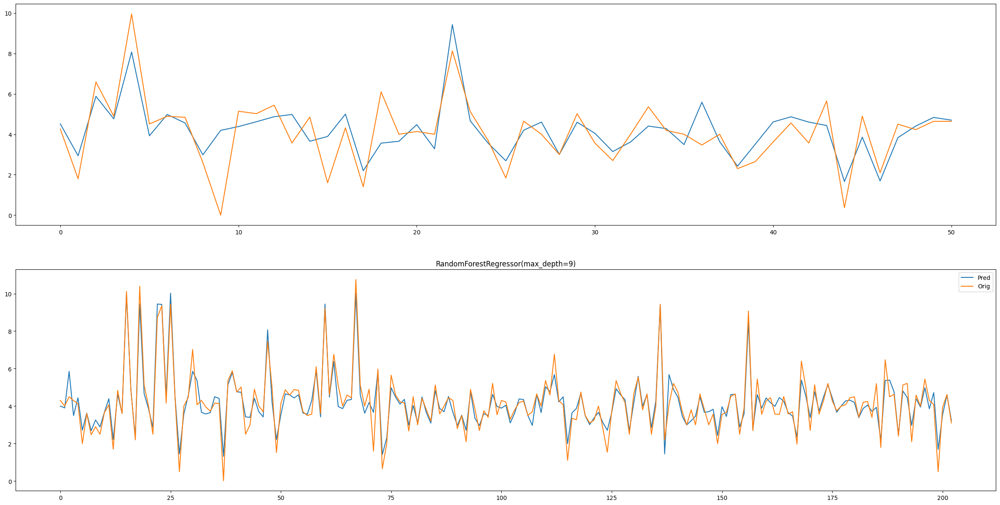

In [130]:
model = RandomForestRegressor(max_depth = 9)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

In [131]:
pickle.dump(model, open('ts.sav', 'wb'))

Train r2:  0.8685728759259234
Train MAE:  0.4658492202060137
Train RMSE:  0.6196827781111879
Test r2:  0.714787012418267
Test MAE:  0.7842234864057939
Test RMSE:  0.9684540739482952
Scatter Index: 5.868328539999053
K Fold MAE: 0.9338551105879219


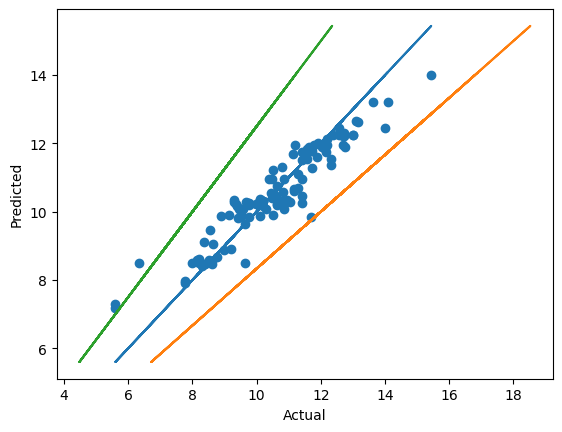

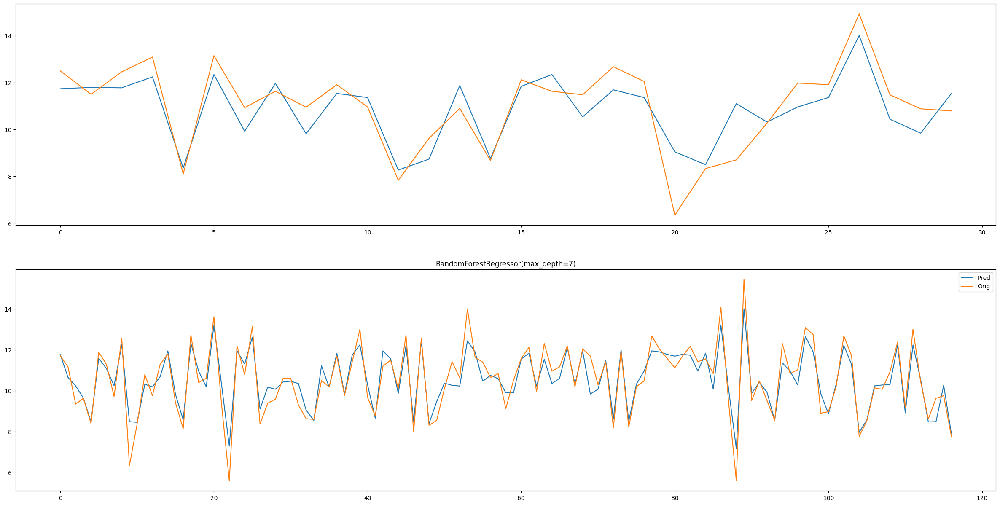

In [132]:
model = RandomForestRegressor(max_depth = 7)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

In [133]:
pickle.dump(model, open('fs.sav', 'wb'))

### SVR

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.016 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.008 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.001 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.000 total time=   0.0s
[CV 5/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.003 total time=   0.0s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.002 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.003 total time=   0.0s
[CV 3/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.016 total time=   0.0s
[CV 4/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.011 total time=   0.0s
[CV 5/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.013 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.000 total time=   0.0s
[CV 2/5] END ....C=0.1, gamma=0.01, kernel=rbf;

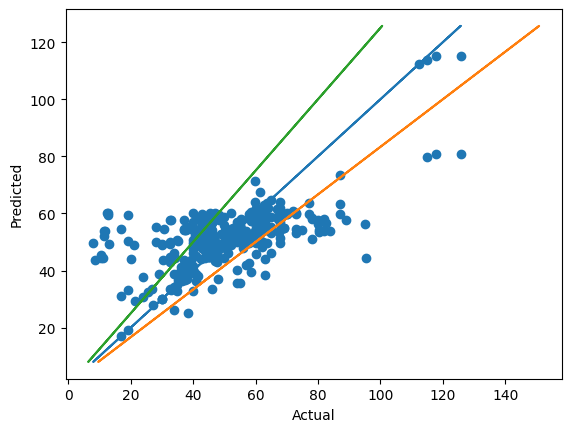

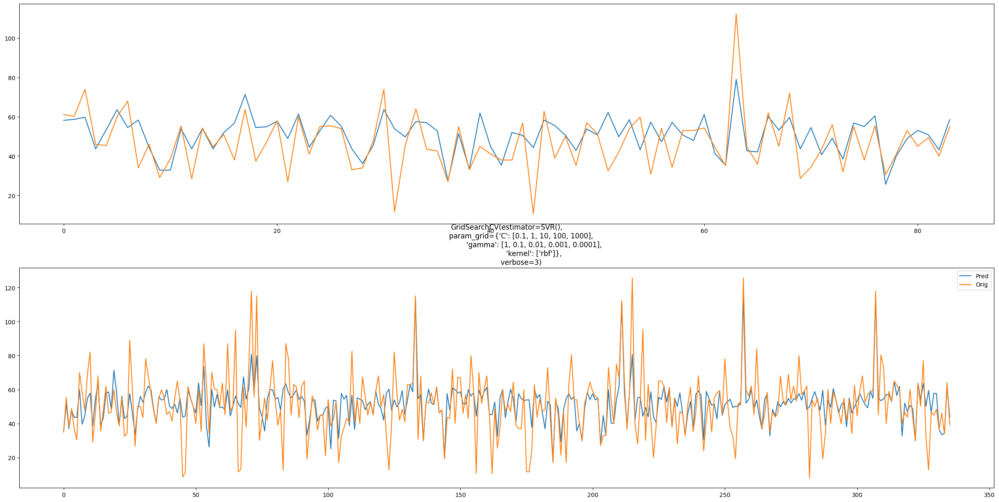

In [134]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
pipeline(grid, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.084 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.093 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.243 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.214 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.228 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.025 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.032 total time=   0.0s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.038 total time=   0.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.046 total time=   0.0s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.077 total time=   0.0s
[CV 1/5] END ....C=0.1, gamma=0.01, kernel=rbf;, score=-0.028 total time=   0.0s
[CV 2/5] END ....C=0.1, gamma=0.01, kernel=rbf;

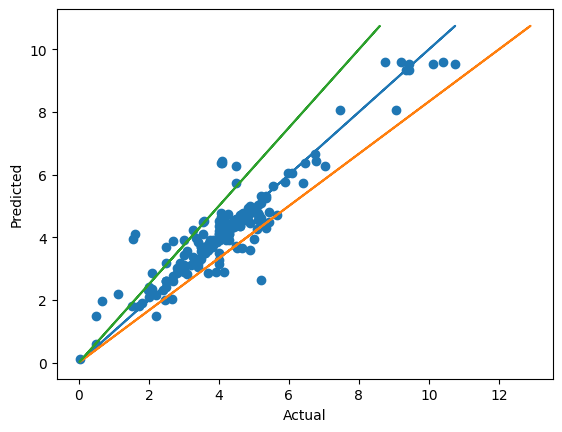

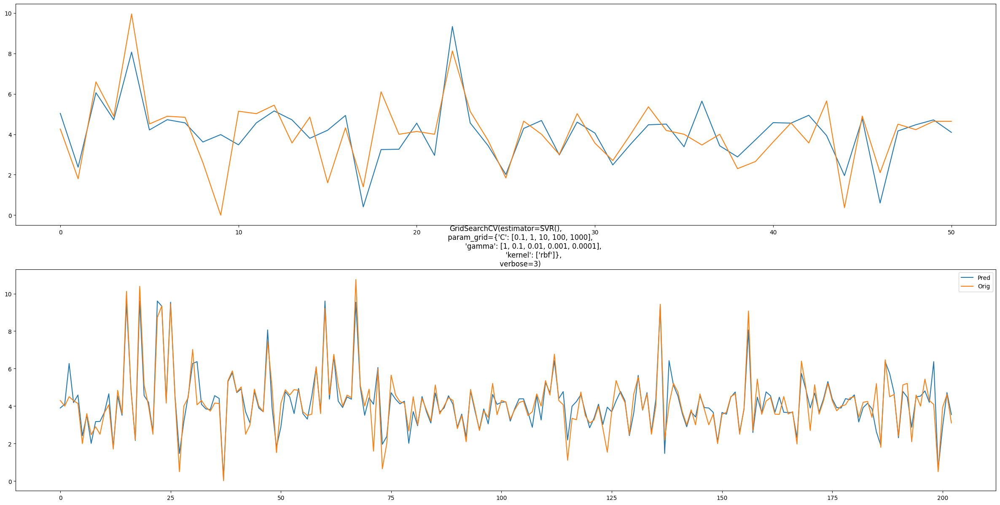

In [135]:
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
pipeline(grid, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.008 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.065 total time=   0.0s
[CV 3/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.325 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.142 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.107 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.038 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.015 total time=   0.0s
[CV 3/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.208 total time=   0.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.019 total time=   0.0s
[CV 5/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.013 total time=   0.0s
[CV 1/5] END ....C=0.1, gamma=0.01, kernel=rbf;, score=-0.051 total time=   0.0s
[CV 2/5] END ....C=0.1, gamma=0.01, kernel=rbf;

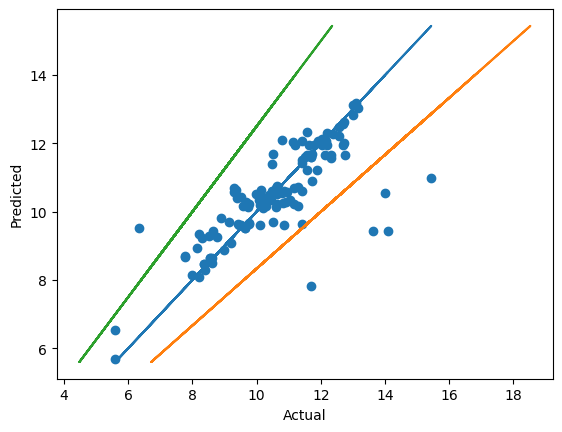

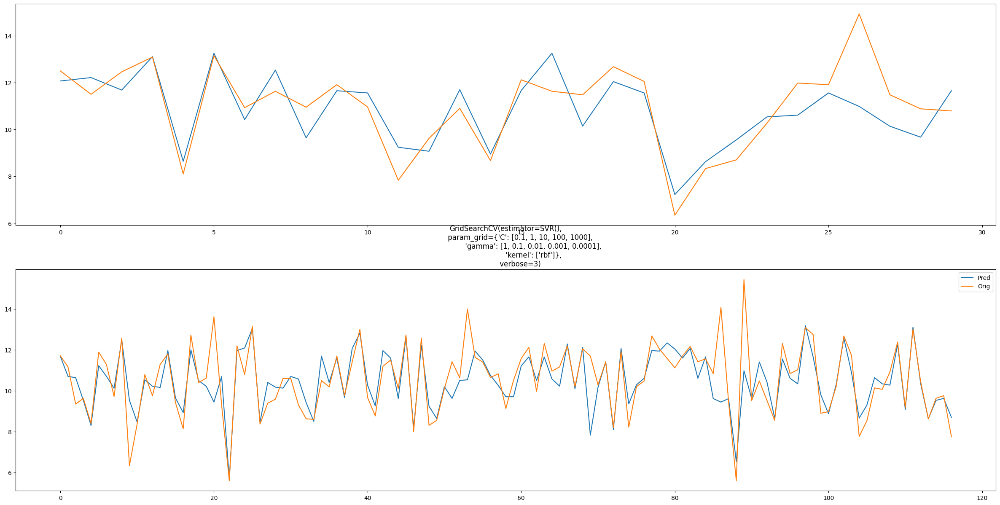

In [136]:
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
pipeline(grid, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

### XGBoost

Train r2:  0.959867092075918
Train MAE:  1.492705759093875
Train RMSE:  3.763182006236976
Test r2:  0.4226237391995895
Test MAE:  8.239073529198057
Test RMSE:  10.997904370902498
Scatter Index: 7.359317301783834
K Fold MAE: 10.460185161945589


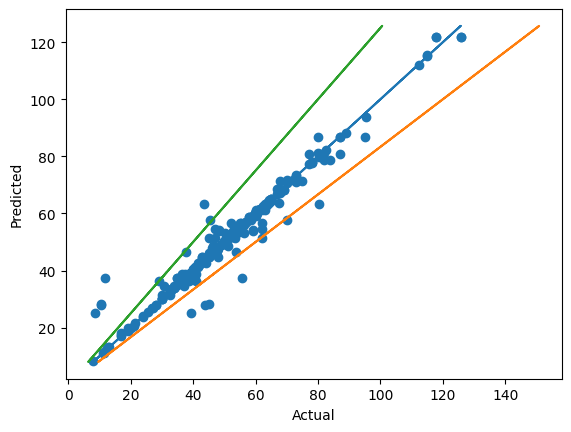

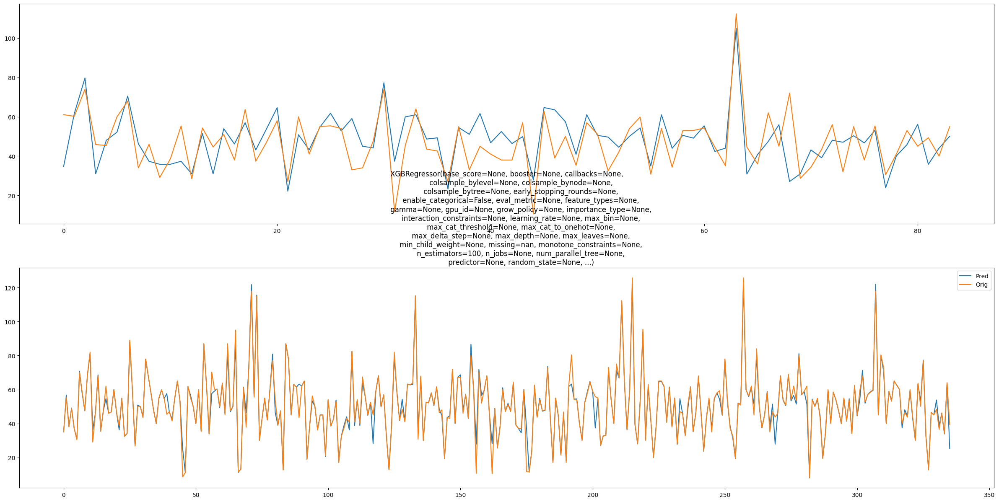

In [137]:
from xgboost import XGBRegressor
model = XGBRegressor()
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Train r2:  0.9539401358145908
Train MAE:  0.14470569950533033
Train RMSE:  0.35367978849637627
Test r2:  0.5035223159049411
Test MAE:  0.7969736903788996
Test RMSE:  1.1915323519341867
Scatter Index: 8.431665315857128
K Fold MAE: 0.6901231243802279


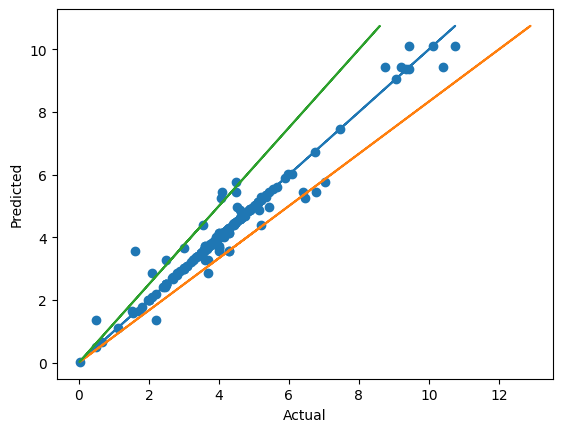

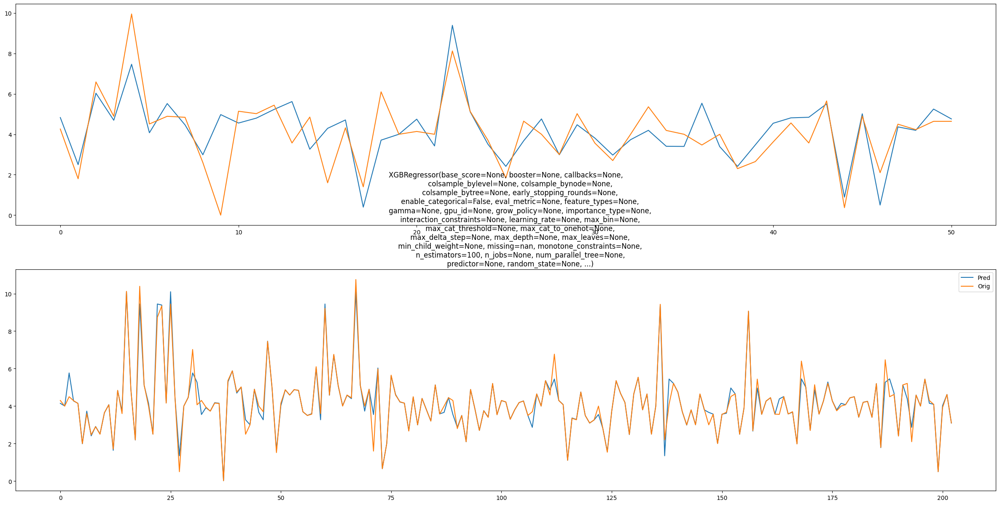

In [138]:
model = XGBRegressor()
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Train r2:  0.9554517320319278
Train MAE:  0.1815831037668081
Train RMSE:  0.360779901788843
Test r2:  0.669464777746229
Test MAE:  0.8507378114064534
Test RMSE:  1.0425652712916647
Scatter Index: 3.4126130039276346
K Fold MAE: 0.9473851706947105


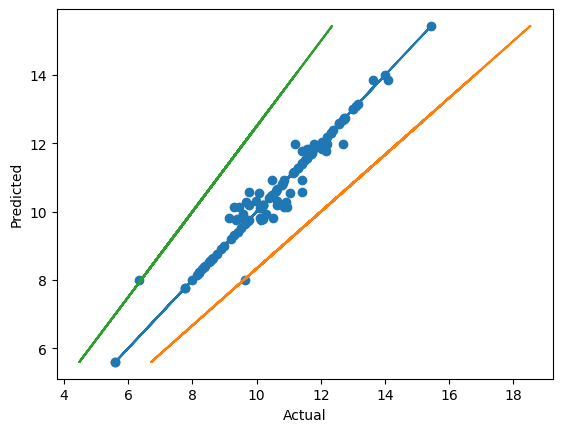

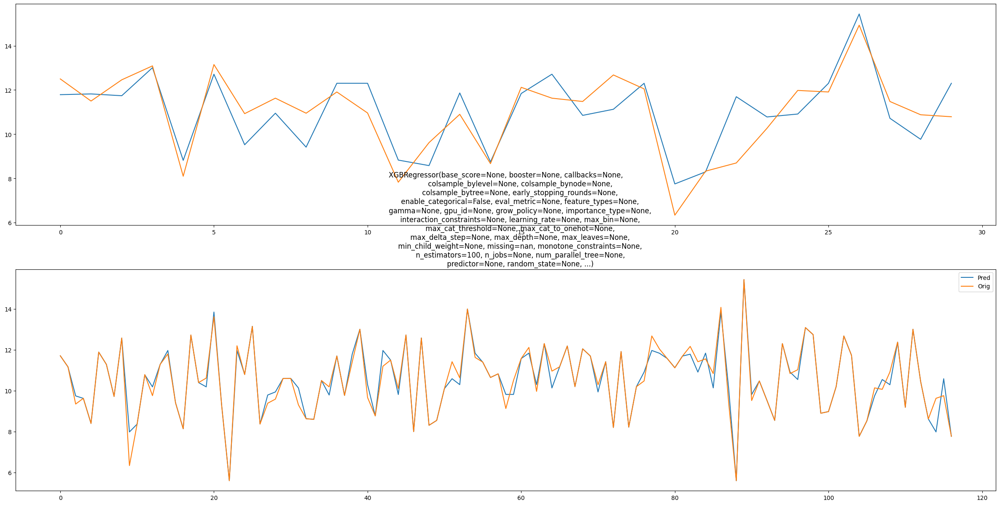

In [139]:
model = XGBRegressor()
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

### ANN

Train r2:  0.4288637309582304
Train MAE:  10.34310185907303
Train RMSE:  14.196287278152923
Test r2:  0.39041558274363286
Test MAE:  8.635581414754718
Test RMSE:  11.300493390046471
Scatter Index: 27.88063438366698
K Fold MAE: 12.381322249418272


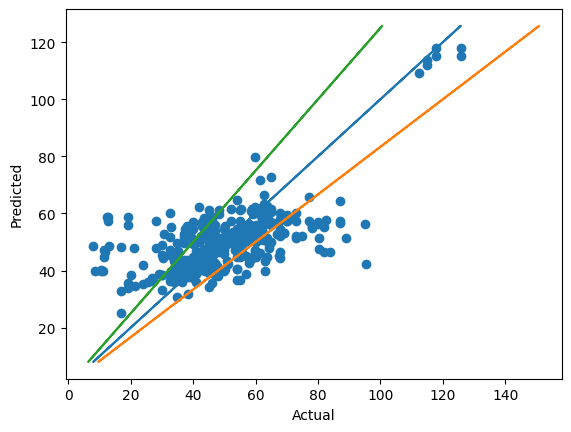

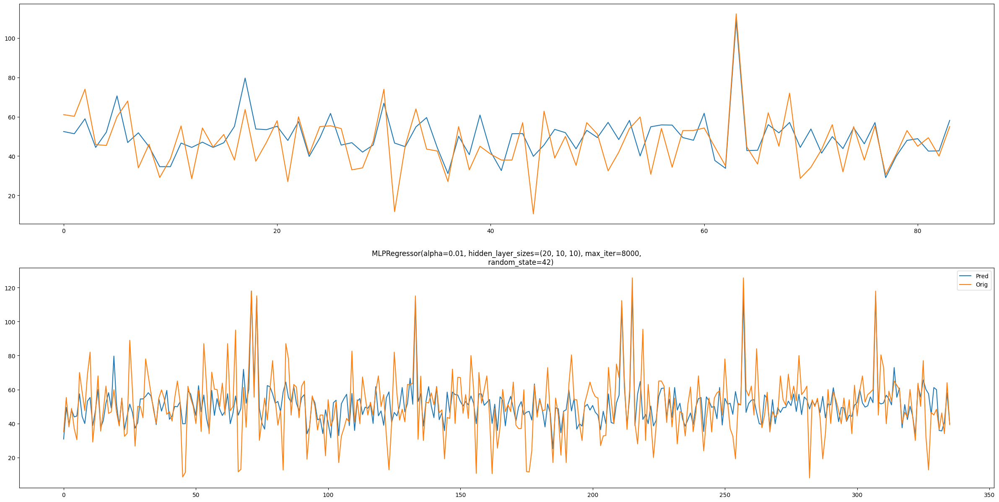

In [140]:
from sklearn.neural_network import MLPRegressor
model = MLPRegressor(hidden_layer_sizes = (20, 10, 10), alpha=0.01, random_state=42, max_iter=8000)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Train r2:  0.6578707095396478
Train MAE:  0.7225930872948894
Train RMSE:  0.9639267753933533
Test r2:  0.5238504583771127
Test MAE:  0.8913696170734179
Test RMSE:  1.1668839267571605
Scatter Index: 23.822911240258446
K Fold MAE: 0.7450966000832334


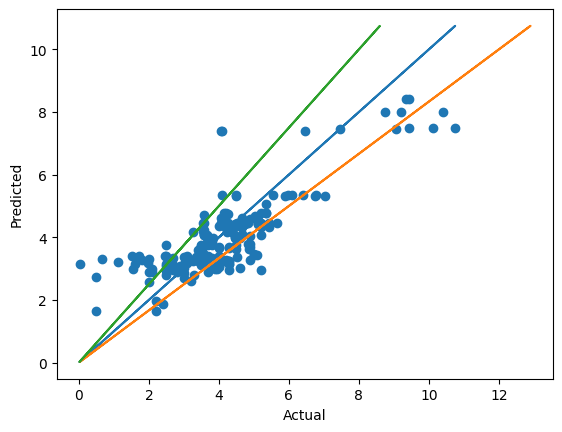

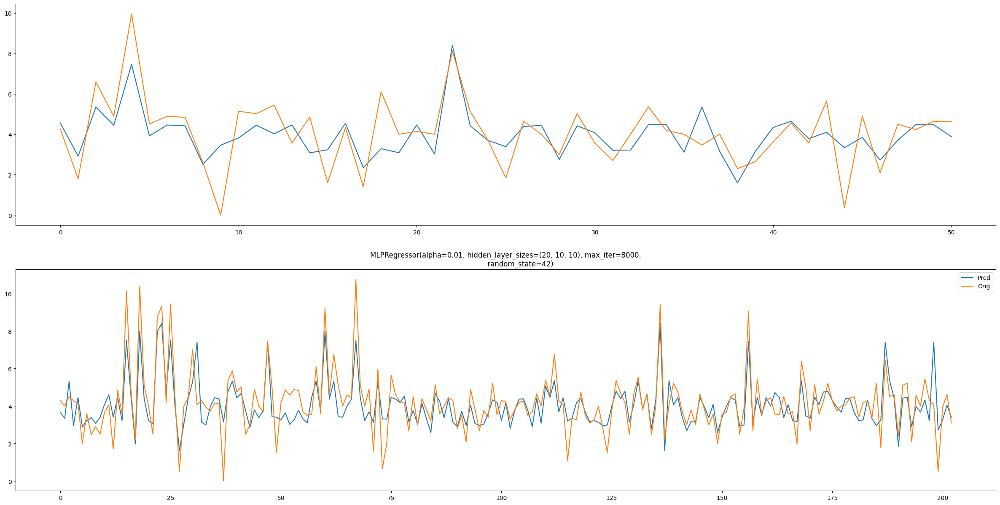

In [141]:
model = MLPRegressor(hidden_layer_sizes = (20, 10, 10), alpha=0.01, random_state=42, max_iter=8000)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Train r2:  0.5394870860809731
Train MAE:  0.836096809695007
Train RMSE:  1.1599728677426209
Test r2:  0.6172301225724677
Test MAE:  0.9608611070782683
Test RMSE:  1.1219235338733522
Scatter Index: 10.971158956751909
K Fold MAE: 1.120426589970682


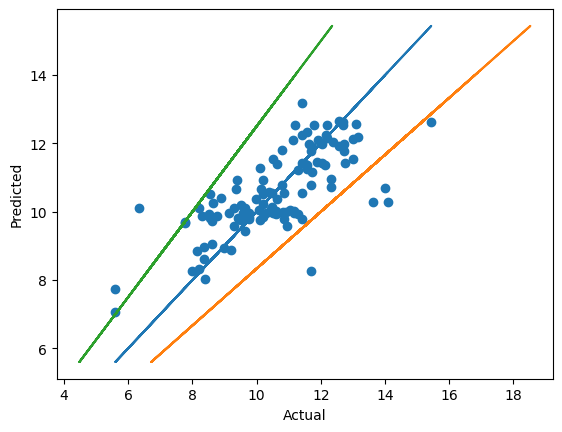

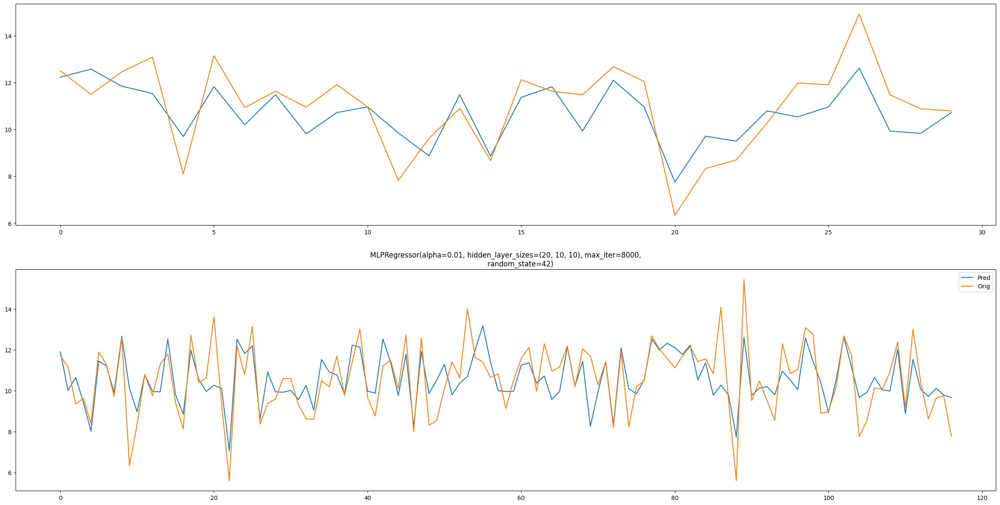

In [142]:
model = MLPRegressor(hidden_layer_sizes = (20, 10, 10), alpha=0.01, random_state=42, max_iter=8000)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

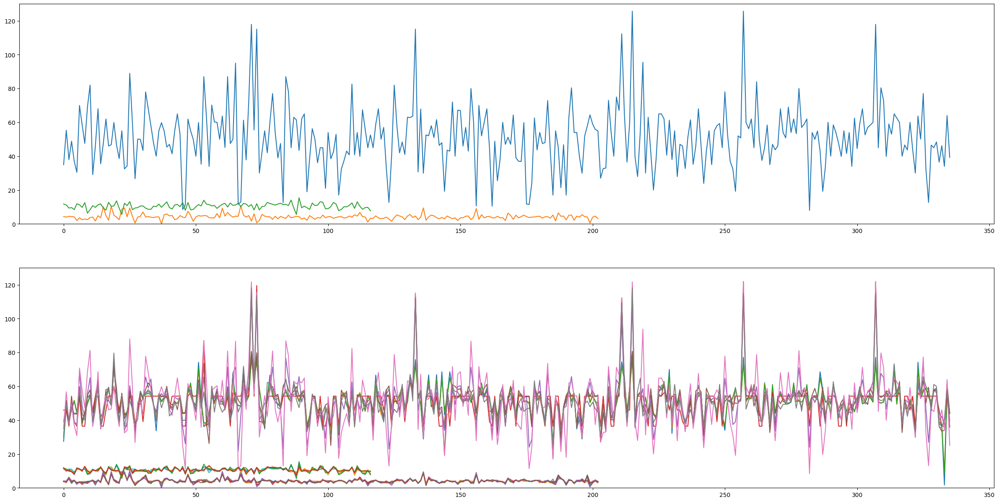

In [143]:
fig, ax = plt.subplots(2, 1)
fig.set_figheight(15)
fig.set_figwidth(30)
ax[0].set_ylim((0, 130))
ax[1].set_ylim((0, 130))
ax[0].plot(range(len(cs_y_train)), cs_y_train, label='CS')
ax[0].plot(range(len(ts_y_train)), ts_y_train, label='TS')
ax[0].plot(range(len(fs_y_train)), fs_y_train, label='FS')
for k1 in final_preds.keys():
    for k2 in range(len(final_preds[k1])):
        for k in final_preds[k1][k2].keys():
            ax[1].plot(range(len(final_preds[k1][k2][k])), final_preds[k1][k2][k])

In [144]:
df_cs = pd.DataFrame()
for k1 in range(len(final_preds['CS'])):
        df = pd.DataFrame.from_dict(final_preds['CS'][k1])
        df_cs = pd.concat([df_cs, df], axis=1)
df_cs = pd.concat([df_cs, train_cs], axis=1)

df_ts = pd.DataFrame()
for k1 in range(len(final_preds['TS'])):
        df = pd.DataFrame.from_dict(final_preds['TS'][k1])
        df_ts = pd.concat([df_ts, df], axis=1)
df_ts = pd.concat([df_ts, train_ts], axis=1)

df_fs = pd.DataFrame()
for k1 in range(len(final_preds['FS'])):
        df = pd.DataFrame.from_dict(final_preds['FS'][k1])
        df_fs = pd.concat([df_fs, df], axis=1)
df_fs = pd.concat([df_fs, train_fs], axis=1)
df_fs.columns        

Index(['LinearRegression()', 'Ridge(alpha=0.5)', 'Lasso(alpha=0.001)',
       'DecisionTreeRegressor(max_depth=4)',
       'RandomForestRegressor(max_depth=7)',
       'GridSearchCV(estimator=SVR(),\n             param_grid={'C': [0.1, 1, 10, 100, 1000],\n                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],\n                         'kernel': ['rbf']},\n             verbose=3)',
       'XGBRegressor(base_score=None, booster=None, callbacks=None,\n             colsample_bylevel=None, colsample_bynode=None,\n             colsample_bytree=None, early_stopping_rounds=None,\n             enable_categorical=False, eval_metric=None, feature_types=None,\n             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,\n             interaction_constraints=None, learning_rate=None, max_bin=None,\n             max_cat_threshold=None, max_cat_to_onehot=None,\n             max_delta_step=None, max_depth=None, max_leaves=None,\n             min_child_weight=None, missing=na

In [145]:
df_cs.head()

,LinearRegression(),Ridge(alpha=0.5),Lasso(alpha=0.05),DecisionTreeRegressor(max_depth=4),RandomForestRegressor(max_depth=8),"GridSearchCV(estimator=SVR(),\n param_grid={'C': [0.1, 1, 10, 100, 1000],\n 'gamma': [1, 0.1, 0.01, 0.001, 0.0001],\n 'kernel': ['rbf']},\n verbose=3)","XGBRegressor(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, gpu_id=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=None, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=None, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n n_estimators=100, n_jobs=None, num_parallel_tree=None,\n predictor=None, random_state=None, ...)","MLPRegressor(alpha=0.01, hidden_layer_sizes=(20, 10, 10), max_iter=8000,\n random_state=42)",Actual
0,27.473150,31.092431,29.759612,45.967241,38.996188,35.099720,34.983280,30.860706,35.00
1,48.038199,48.338138,47.976252,45.967241,50.772832,51.780918,56.759773,49.508608,55.30
2,38.699724,39.363125,39.686242,36.460154,40.371687,36.957907,38.227463,39.750453,38.00
3,46.854782,46.783035,46.111173,54.199761,51.712744,47.900992,49.111507,48.046930,48.85
4,51.180296,51.678685,51.595672,39.116364,38.425815,43.617576,36.930603,43.878845,37.00


In [146]:
df_cs.to_excel('Results_CS.xlsx', index=False)
df_ts.to_excel('Results_TS.xlsx', index=False)
df_fs.to_excel('Results_FS.xlsx', index=False)